# Part 1: Understanding the Purpose Behind the Project
### Problem Domain
#### The goal of this project is to analyze salaries in the data science and related industries to understand factors influencing compensation and to build predictive models for salary and experience level. The dataset contains information about job roles, experience levels, employment types, locations, and salaries, which allows us to explore trends, relationships, and patterns in the data science job market.


# Part 2: Data Collection

In [ ]:
import numpy as np
import pandas as pd

In [ ]:
df = pd.read_csv('/content/salaries.csv')
df.head()

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2025,MI,FT,Customer Success Manager,57000,EUR,60000,NL,50,NL,L
1,2025,SE,FT,Engineer,165000,USD,165000,US,0,US,M
2,2025,SE,FT,Engineer,109000,USD,109000,US,0,US,M
3,2025,SE,FT,Applied Scientist,294000,USD,294000,US,0,US,M
4,2025,SE,FT,Applied Scientist,137600,USD,137600,US,0,US,M


In [ ]:
df.info()
print(df.shape)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88584 entries, 0 to 88583
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   work_year           88584 non-null  int64 
 1   experience_level    88584 non-null  object
 2   employment_type     88584 non-null  object
 3   job_title           88584 non-null  object
 4   salary              88584 non-null  int64 
 5   salary_currency     88584 non-null  object
 6   salary_in_usd       88584 non-null  int64 
 7   employee_residence  88584 non-null  object
 8   remote_ratio        88584 non-null  int64 
 9   company_location    88584 non-null  object
 10  company_size        88584 non-null  object
dtypes: int64(4), object(7)
memory usage: 7.4+ MB
(88584, 11)


In [ ]:
print('Summary Statistics for not numeric columns:')
display(df.describe(include = object))

Summary Statistics for not numeric columns:


,experience_level,employment_type,job_title,salary_currency,employee_residence,company_location,company_size
count,88584,88584,88584,88584,88584,88584,88584
unique,4,4,312,26,96,90,3
top,SE,FT,Data Scientist,USD,US,US,M
freq,51596,88111,13156,83994,79705,79762,85667


In [ ]:
print('Summary Statistics for numeric columns:')
display(df.describe())

Summary Statistics for numeric columns:


,work_year,salary,salary_in_usd,remote_ratio
count,88584.000000,8.858400e+04,88584.000000,88584.000000
mean,2024.034758,1.619323e+05,157567.798417,21.286011
std,0.620370,1.965317e+05,73531.373158,40.831018
min,2020.000000,1.400000e+04,15000.000000,0.000000
25%,2024.000000,1.060000e+05,106097.250000,0.000000
50%,2024.000000,1.470000e+05,146307.000000,0.000000
75%,2024.000000,1.995000e+05,198600.000000,0.000000
max,2025.000000,3.040000e+07,800000.000000,100.000000


###  Making the Dataset "Dirty"

In [ ]:
# Create a copy to modify
df_dirty = df.copy()

In [ ]:
# Introduce missing values
np.random.seed(42)
mask = np.random.choice([True, False], size=df_dirty.shape[0], p=[0.05, 0.95])
df_dirty.loc[mask, 'salary_in_usd'] = np.nan
df_dirty.loc[mask, 'experience_level'] = np.nan

In [ ]:
# Introduce duplicates
duplicates = df_dirty.sample(100, random_state=42)
df_dirty = pd.concat([df_dirty, duplicates], ignore_index=True)

In [ ]:
# Introduce outliers
outlier_indices = np.random.choice(df_dirty.index, size=int(0.01 * df_dirty.shape[0]), replace=False)
df_dirty.loc[outlier_indices, 'salary_in_usd'] = df_dirty.loc[outlier_indices, 'salary_in_usd'] * 10

In [ ]:
# Introduce inconsistent entries in job_title
import random
df_dirty['job_title'] = df_dirty['job_title'].apply(lambda x: x.upper() if random.random() > 0.5 else x.lower())

In [ ]:
# Verify dirtiness
print("Dataset Info After Introducing Noise:")
df_dirty.info()

Dataset Info After Introducing Noise:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88684 entries, 0 to 88683
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   work_year           88684 non-null  int64  
 1   experience_level    84287 non-null  object 
 2   employment_type     88684 non-null  object 
 3   job_title           88684 non-null  object 
 4   salary              88684 non-null  int64  
 5   salary_currency     88684 non-null  object 
 6   salary_in_usd       84287 non-null  float64
 7   employee_residence  88684 non-null  object 
 8   remote_ratio        88684 non-null  int64  
 9   company_location    88684 non-null  object 
 10  company_size        88684 non-null  object 
dtypes: float64(1), int64(3), object(7)
memory usage: 7.4+ MB


In [ ]:
print("\nDuplicate Rows:", df_dirty.duplicated().sum())


Duplicate Rows: 32981


In [ ]:
# Save dirty dataset for reference
df_dirty.to_csv('salaries_dirty.csv', index=False)

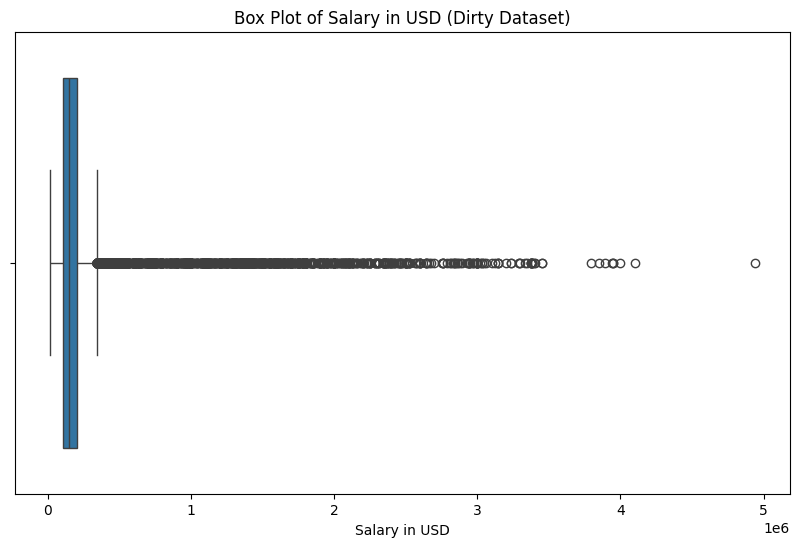

In [ ]:
#Visualize Outliers in `salary_in_usd`
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
sns.boxplot(x=df_dirty['salary_in_usd'])
plt.title('Box Plot of Salary in USD (Dirty Dataset)')
plt.xlabel('Salary in USD')
plt.show()

# Part 3. Data Cleaning or Refinement:

In [ ]:
df = pd.read_csv('salaries_dirty.csv')

In [ ]:
# Fill or drop remaining NA values
df = df.dropna(subset=['salary_in_usd','experience_level'])


In [ ]:
df.isnull().sum()

,0
work_year,0
experience_level,0
employment_type,0
job_title,0
salary,0
salary_currency,0
salary_in_usd,0
employee_residence,0
remote_ratio,0
company_location,0


In [ ]:
df.dtypes

,0
work_year,int64
experience_level,object
employment_type,object
job_title,object
salary,int64
salary_currency,object
salary_in_usd,float64
employee_residence,object
remote_ratio,int64
company_location,object


In [ ]:
df.columns

Index(['work_year', 'experience_level', 'employment_type', 'job_title',
       'salary', 'salary_currency', 'salary_in_usd', 'employee_residence',
       'remote_ratio', 'company_location', 'company_size'],
      dtype='object')

In [ ]:
for col in df.columns:
    print(f"Unique values in '{col}':")
    print(df[col].unique())
    print('-' * 40)

Unique values in 'work_year':
[2025 2024 2022 2023 2020 2021]
----------------------------------------
Unique values in 'experience_level':
['MI' 'SE' 'EN' 'EX']
----------------------------------------
Unique values in 'employment_type':
['FT' 'CT' 'PT' 'FL']
----------------------------------------
Unique values in 'job_title':
['customer success manager' 'engineer' 'ENGINEER' 'APPLIED SCIENTIST'
 'data analyst' 'software development engineer' 'research scientist'
 'data scientist' 'platform engineer' 'computational biologist'
 'COMPUTATIONAL BIOLOGIST' 'ai data scientist' 'AI DATA SCIENTIST'
 'admin & data analyst' 'CLOUD ENGINEER' 'cloud engineer'
 'data management specialist' 'DATA PRODUCT OWNER' 'data product owner'
 'RESEARCH SCIENTIST' 'software engineer' 'SOFTWARE ENGINEER'
 'MACHINE LEARNING ENGINEER' 'machine learning engineer' 'ASSOCIATE'
 'associate' 'DATA ENGINEER' 'product manager' 'PRODUCT MANAGER'
 'DATA OPERATIONS ENGINEER' 'BUSINESS INTELLIGENCE ENGINEER'
 'research 

In [ ]:
df.duplicated().any()

np.True_

In [ ]:
df[df.duplicated()]

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
33,2025,EN,FT,RESEARCH SCIENTIST,187040,USD,187040.0,US,0,US,M
73,2025,SE,FT,APPLIED SCIENTIST,137600,USD,137600.0,US,0,US,M
273,2025,MI,FT,DATABASE ADMINISTRATOR,62128,USD,62128.0,US,0,US,M
319,2025,SE,FT,data engineer,144200,USD,144200.0,US,0,US,M
323,2025,SE,FT,DATA ENGINEER,144200,USD,144200.0,US,0,US,M
...,...,...,...,...,...,...,...,...,...,...,...
88679,2024,SE,FT,DATA SCIENTIST,151800,USD,151800.0,US,100,US,M
88680,2024,SE,FT,DATA SCIENTIST,105800,USD,105800.0,US,0,US,M
88681,2024,SE,FT,SOFTWARE ENGINEER,328000,USD,328000.0,US,0,US,M
88682,2025,EX,FT,DEVELOPER,145440,USD,145440.0,US,0,US,M


In [ ]:
df.duplicated().sum()

np.int64(32542)

In [ ]:
df = df.drop_duplicates()

In [ ]:
df.duplicated().sum()

np.int64(0)

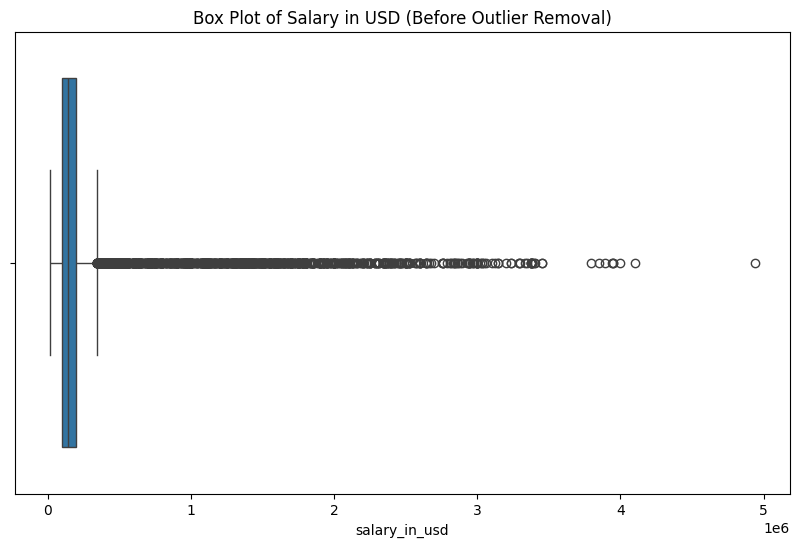

In [ ]:
# 5. Detect and Remove Outliers (IQR Method)
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['salary_in_usd'])
plt.title('Box Plot of Salary in USD (Before Outlier Removal)')
plt.show()

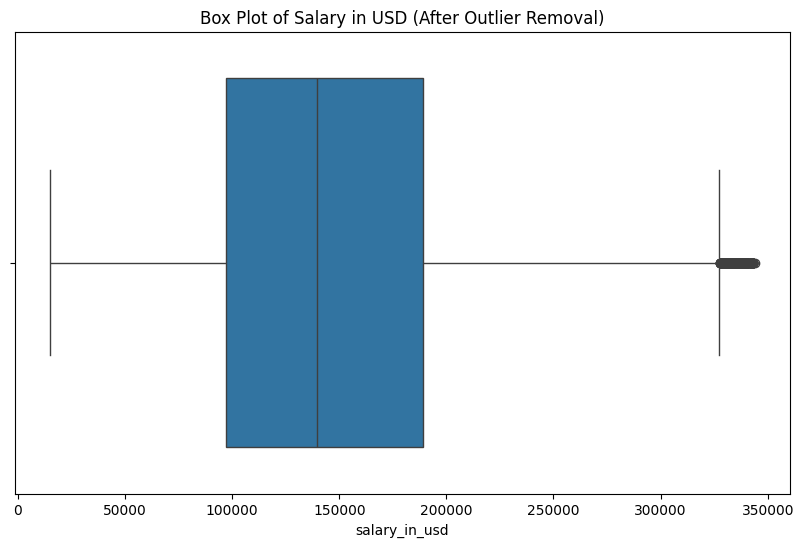

In [ ]:
Q1 = df['salary_in_usd'].quantile(0.25)
Q3 = df['salary_in_usd'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
df = df[(df['salary_in_usd'] >= lower_bound) & (df['salary_in_usd'] <= upper_bound)]

plt.figure(figsize=(10, 6))
sns.boxplot(x=df['salary_in_usd'])
plt.title('Box Plot of Salary in USD (After Outlier Removal)')
plt.show()


In [ ]:
df_cleaned1 = df.copy()

In [ ]:
experience_level = {
    "EN": "Junior",
    "MI": "Intermediate",
    "SE": "Senior Expert",
    "EX": "Executive Director"
}
employment_type = {
    "PT": "Part-Time",
    "FT": "Full-Time",
    "CT": "Contract-Based",
    "FL": "Freelance"
}
remote_work_ratio = {
    0: "On-Site (No Remote Work)",
    50: "Hybrid (50% Remote)",
    100: "Fully Remote"
}
company_sizes = {
    "S": "Small Business",
    "M": "Mid-Sized Company",
    "L": "Large Enterprise"
}
df_cleaned1["experience_level"] = df_cleaned1["experience_level"].map(experience_level)
df_cleaned1["employment_type"] = df_cleaned1["employment_type"].map(employment_type)
df_cleaned1["remote_ratio"] = df_cleaned1["remote_ratio"].map(remote_work_ratio)
df_cleaned1["company_size"] = df_cleaned1["company_size"].map(company_sizes)

In [ ]:
df_cleaned1.head()
print(df_cleaned1.shape)

(49983, 11)


In [ ]:
df_cleaned1= df_cleaned1.sort_values(by='work_year')
df_cleaned1['work_year']

,work_year
88572,2020
88570,2020
88494,2020
88495,2020
88569,2020
...,...
9805,2025
9804,2025
9872,2025
9802,2025


In [ ]:
df_cleaned1['job_title'] = df_cleaned1['job_title'].str.lower().str.strip()

# Part 4: Exploratory Data Analysis

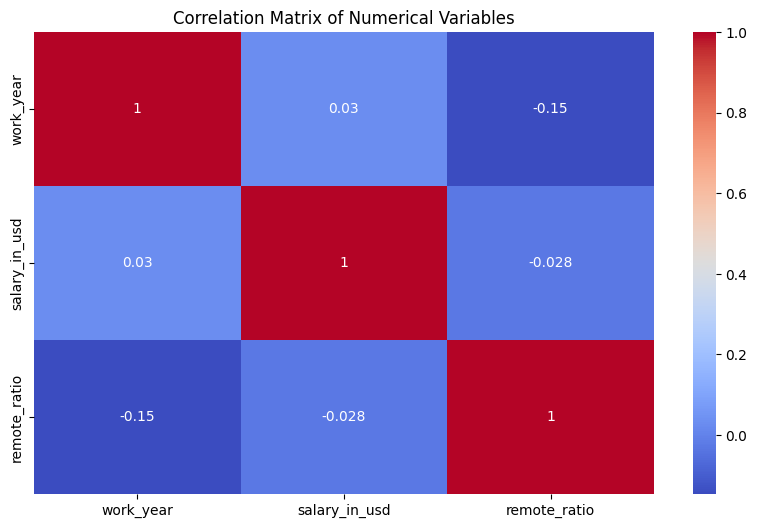

In [ ]:
# Correlation Matrix (Numerical Variables)
plt.figure(figsize=(10, 6))
sns.heatmap(df[['work_year', 'salary_in_usd', 'remote_ratio']].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Numerical Variables')
plt.show()


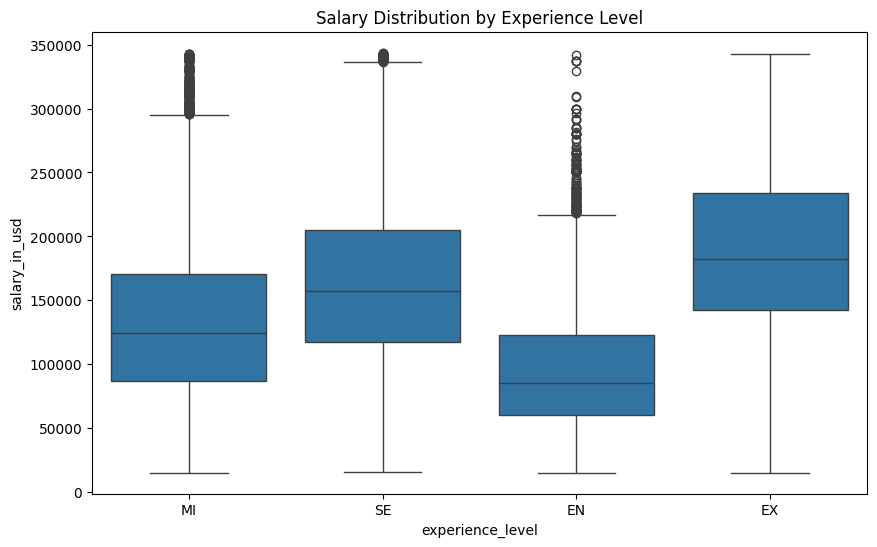

In [ ]:
# Relationship: Salary vs. Experience Level
plt.figure(figsize=(10, 6))
sns.boxplot(x='experience_level', y='salary_in_usd', data=df)
plt.title('Salary Distribution by Experience Level')
plt.show()


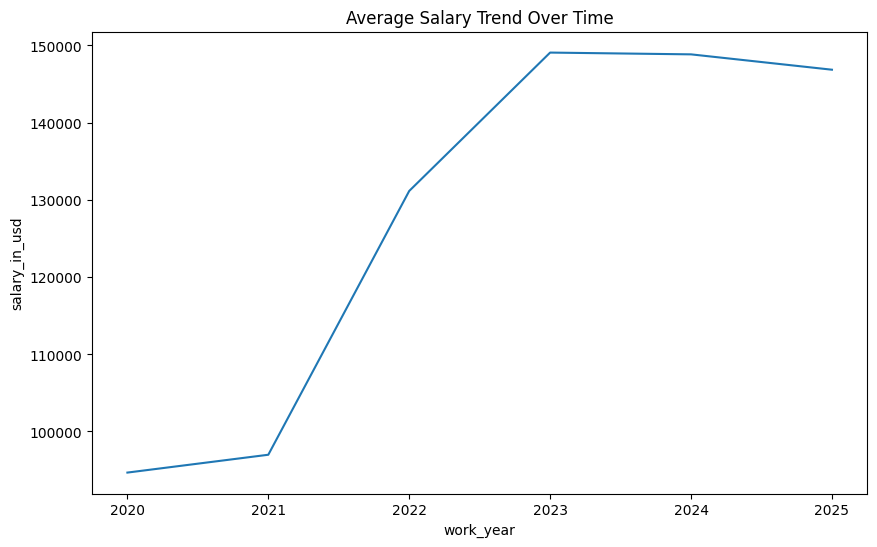

In [ ]:
# Trend: Salary Over Time
yearly_salary = df.groupby('work_year')['salary_in_usd'].mean().reset_index()
plt.figure(figsize=(10, 6))
sns.lineplot(x='work_year', y='salary_in_usd', data=yearly_salary)
plt.title('Average Salary Trend Over Time')
plt.show()

<Figure size 1000x600 with 0 Axes>

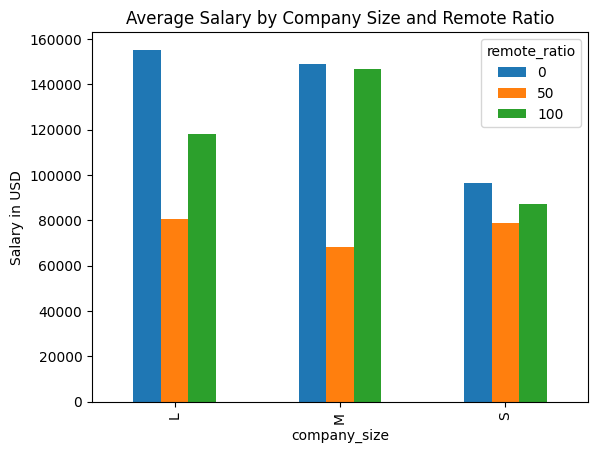

In [ ]:
# Segmentation: Salary by Company Size and Remote Ratio
segmented_data = df.groupby(['company_size', 'remote_ratio'])['salary_in_usd'].mean().unstack()
plt.figure(figsize=(10, 6))
segmented_data.plot(kind='bar')
plt.title('Average Salary by Company Size and Remote Ratio')
plt.ylabel('Salary in USD')
plt.show()


# Part 5: Visualization

In [ ]:
import plotly.express as px

fig = px.histogram(df_cleaned1, x='salary_in_usd', nbins=30, title='Salary Distribution in USD')
fig.show()


In [ ]:
fig = px.box(df_cleaned1, x='experience_level', y='salary_in_usd', title='Box Plot: Salary by Experience')
fig.show()

In [ ]:
grouped = df_cleaned1.groupby(['work_year', 'job_title'])['salary_in_usd'].mean().reset_index()

import plotly.express as px
fig = px.bar(grouped, x='job_title', y='salary_in_usd', color='work_year',
             title='Average Salary by Job Title and Year')
fig.show()


In [ ]:

# Group by job title and calculate median salary
top_jobs = df_cleaned1.groupby("job_title")["salary_in_usd"].median().sort_values(ascending=False).head(10).reset_index()

# Create bar plot with Plotly Express
fig = px.bar(
    top_jobs,
    x="job_title",
    y="salary_in_usd",
    title="Top 10 Jobs by Median Salary",
    labels={"job_title": "Job Title", "salary_in_usd": "Median Salary (USD)"},
    color="salary_in_usd",
    color_continuous_scale="Greens"
)

fig.update_layout(xaxis_tickangle=-45)
fig.show()


In [ ]:
cumulative_salary = df_cleaned1.groupby('work_year')['salary_in_usd'].sum().reset_index()

fig = px.area(
    cumulative_salary,
    x='work_year',
    y='salary_in_usd',
    title='Cumulative Salary Over Time (Area Plot)'
)
fig.show()


In [ ]:
fig = px.pie(
    df_cleaned1,
    names='employment_type',
    title='employment type Distribution (Pie Chart)'
)
fig.show()


In [ ]:
fig = px.scatter(
    df_cleaned1,
    x='company_location',
    y='salary_in_usd',
    color='experience_level',
    title='Salary by Company Location (Simple Scatter Plot)',
    hover_data=['job_title']
)
fig.show()


In [ ]:
fig = px.scatter(
    df_cleaned1,
    x='remote_ratio',
    y='salary_in_usd',
    size='salary_in_usd',
    color='experience_level',
    title='Remote Ratio vs Salary (Bubble Plot)',
    hover_data=['job_title']
)
fig.show()

# Part 6: Feature Engineering

In [ ]:
# Get all categorical (object) columns
categorical_columns = df_cleaned1.select_dtypes(include=['object']).columns


In [ ]:
from sklearn.preprocessing import LabelEncoder

# Apply Label Encoding
for col in categorical_columns:
    le = LabelEncoder()
    df_cleaned1[col] = le.fit_transform(df_cleaned1[col])

In [ ]:
# Step 1: Select numeric columns
numeric_df = df_cleaned1.select_dtypes(include=['number'])

# Step 2: Compute correlation matrix and round values
corr_matrix = numeric_df.corr().round(2)

# Step 3: Plot with Plotly
fig = px.imshow(
    corr_matrix,
    text_auto=True,  # Shows values inside cells
    color_continuous_scale='RdBu',
    title='Rounded Correlation Matrix of Numeric Features'
)
fig.show()


In [ ]:
# Get all numeric columns except salary_in_usd (for x-axis)
numeric_cols = df_cleaned1.select_dtypes(include='number').columns.tolist()
numeric_cols.remove('salary_in_usd')

# Create scatter plots: one for each numeric column vs salary_in_usd
for col in numeric_cols:
    fig = px.scatter(
        df_cleaned1,
        x=col,
        y='salary_in_usd',
        color=col,  # optional, helps see grouping
        title=f'Salary in USD vs {col}'
    )
    fig.show()


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor

In [ ]:
df_cleaned1.columns

Index(['work_year', 'experience_level', 'employment_type', 'job_title',
       'salary', 'salary_currency', 'salary_in_usd', 'employee_residence',
       'remote_ratio', 'company_location', 'company_size'],
      dtype='object')

In [ ]:
df_cleaned1.shape

(49983, 11)

# Part 7. Build model:
### Regression Models












In [ ]:
x = df_cleaned1.drop("salary_in_usd", axis = 1)
y = df_cleaned1["salary_in_usd"]

In [ ]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

model_gb = GradientBoostingRegressor(n_estimators=100, random_state=42)
model_gb.fit(x_train, y_train)
model_gb.score(x_test, y_test)

0.9954685818956203

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

reg = RandomForestRegressor(n_estimators=100, random_state=42)
reg.fit(x_train, y_train)

y_pred = reg.predict(x_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("R^2 Score:", r2)

Mean Squared Error: 25816471.245516002
R^2 Score: 0.9941667272999442


In [ ]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x_scaled = sc.fit_transform(x)

In [ ]:
from sklearn.model_selection import train_test_split

x_train_scaled, x_test, y_train, y_test = train_test_split(x_scaled, y, test_size=0.2, random_state=42)

In [ ]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor

models = {
    'Linear': LinearRegression(),
    'Ridge': Ridge(),
    'Lasso': Lasso(),
    'Decision Tree': DecisionTreeRegressor(),
    'Random Forest': RandomForestRegressor(),
    'Gradient Boosting': GradientBoostingRegressor(),
    'SVR': SVR(),
    'KNN': KNeighborsRegressor()
}


In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

results = {}

for name, model in models.items():
    model.fit(x_train_scaled, y_train)
    y_pred = model.predict(x_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    results[name] = {'MSE': mse, 'R2': r2}


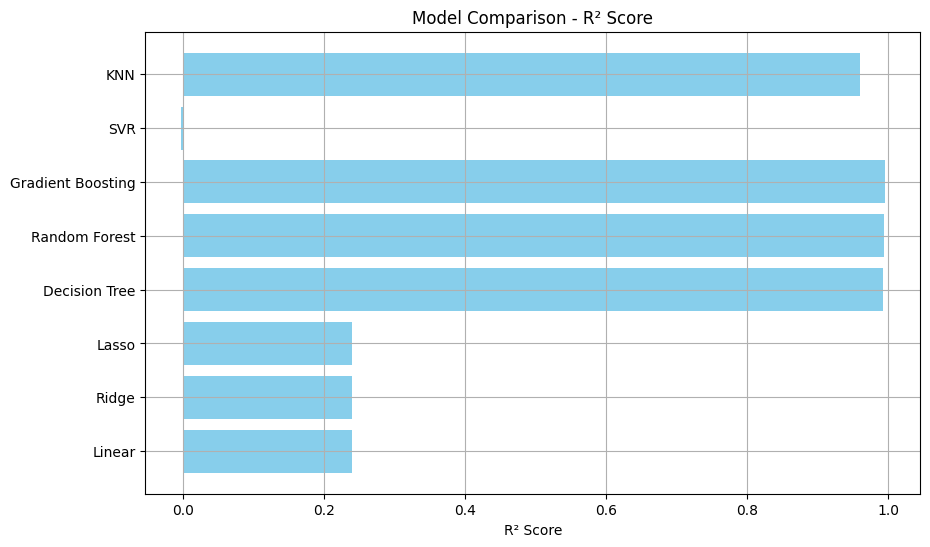

In [ ]:
import matplotlib.pyplot as plt

r2_scores = [results[model]['R2'] for model in results]
model_names = list(results.keys())

plt.figure(figsize=(10,6))
plt.barh(model_names, r2_scores, color='skyblue')
plt.xlabel('R² Score')
plt.title('Model Comparison - R² Score')
plt.grid(True)
plt.show()


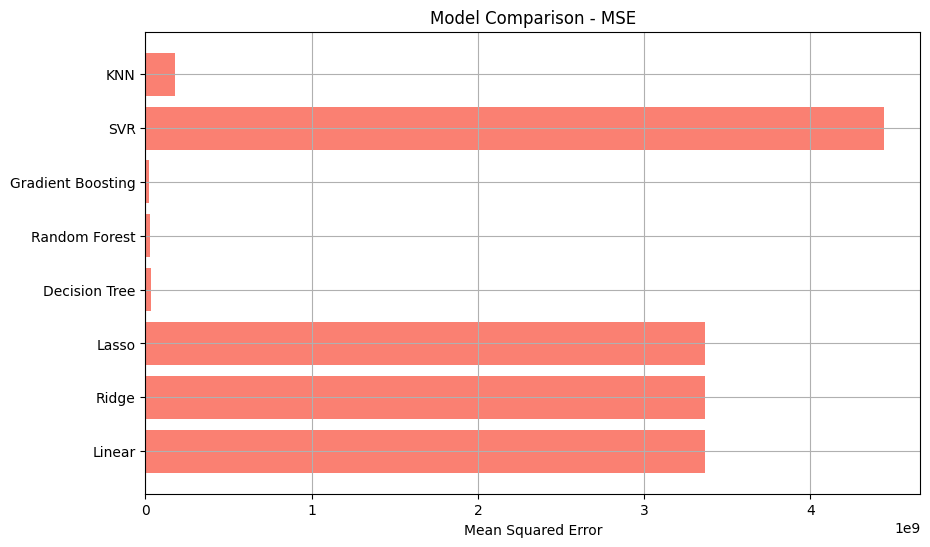

In [ ]:
mse_scores = [results[model]['MSE'] for model in results]

plt.figure(figsize=(10,6))
plt.barh(model_names, mse_scores, color='salmon')
plt.xlabel('Mean Squared Error')
plt.title('Model Comparison - MSE')
plt.grid(True)
plt.show()


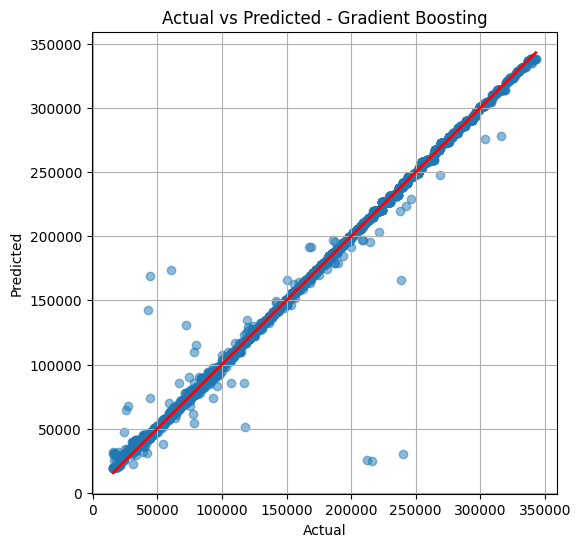

In [ ]:
best_model_name = max(results, key=lambda x: results[x]['R2'])
best_model = models[best_model_name]
y_best_pred = best_model.predict(x_test)

plt.figure(figsize=(6,6))
plt.scatter(y_test, y_best_pred, alpha=0.5)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title(f'Actual vs Predicted - {best_model_name}')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', lw=2)
plt.grid(True)
plt.show()


In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

model_gb = GradientBoostingRegressor(n_estimators=100, random_state=42)
model_gb.fit(x_train_scaled, y_train)
model_gb.score(x_test, y_test)

0.9954685818956203

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

reg = RandomForestRegressor(n_estimators=100, random_state=42)
reg.fit(x_train_scaled, y_train)

y_pred = reg.predict(x_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("R^2 Score:", r2)

Mean Squared Error: 25821050.612344764
R^2 Score: 0.9941656925847326


In [ ]:
from sklearn.neighbors import KNeighborsRegressor

model_knn = KNeighborsRegressor(n_neighbors=5)
model_knn.fit(x_train_scaled, y_train)
y_pred = reg.predict(x_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("R^2 Score:", r2)

Mean Squared Error: 25821050.612344764
R^2 Score: 0.9941656925847326


In [ ]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV

# Step 1: Define the model
dt = DecisionTreeRegressor(random_state=42)

# Step 2: Define the parameter grid to search
param_grid = {
    'max_depth': [3, 5, 10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [None, 'sqrt', 'log2']
}

# Step 3: Define GridSearchCV
grid_search = GridSearchCV(estimator=dt,
                           param_grid=param_grid,
                           scoring='r2',      # Use 'neg_mean_squared_error' if you prefer MSE
                           cv=5,
                           n_jobs=-1,
                           verbose=2)

# Step 4: Fit on training data
grid_search.fit(x_train_scaled, y_train)

print("Best Parameters:", grid_search.best_params_)
print("Best R² Score on validation set:", grid_search.best_score_)


from sklearn.metrics import mean_squared_error, r2_score

best_dt = grid_search.best_estimator_
y_pred = best_dt.predict(x_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Test MSE:", mse)
print("Test R² Score:", r2)


Fitting 5 folds for each of 135 candidates, totalling 675 fits
Best Parameters: {'max_depth': 20, 'max_features': None, 'min_samples_leaf': 2, 'min_samples_split': 10}
Best R² Score on validation set: 0.9915248090538343
Test MSE: 31889248.292606827
Test R² Score: 0.9927945736765681


In [ ]:
from sklearn.decomposition import PCA

# Apply PCA after scaling
pca = PCA(n_components=0.95)  # Retain 95% of variance
x_train_pca = pca.fit_transform(x_train_scaled)
x_test_pca = pca.transform(x_test)


In [ ]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV

dt = DecisionTreeRegressor(random_state=42)

param_grid = {
    'max_depth': [3, 5, 10, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [None, 'sqrt', 'log2']
}

grid_search_pca = GridSearchCV(estimator=dt,
                                param_grid=param_grid,
                                scoring='r2',
                                cv=5,
                                n_jobs=-1,
                                verbose=2)

# Fit on PCA-transformed training data
grid_search_pca.fit(x_train_pca, y_train)


Fitting 5 folds for each of 108 candidates, totalling 540 fits


GridSearchCV(cv=5, estimator=DecisionTreeRegressor(random_state=42), n_jobs=-1,
             param_grid={'max_depth': [3, 5, 10, None],
                         'max_features': [None, 'sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10]},
             scoring='r2', verbose=2)

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

print("Best Parameters:", grid_search_pca.best_params_)
print("Best CV R² Score:", grid_search_pca.best_score_)

# Predict on test set
best_model = grid_search_pca.best_estimator_
y_pred_pca = best_model.predict(x_test_pca)

# Evaluate
mse = mean_squared_error(y_test, y_pred_pca)
r2 = r2_score(y_test, y_pred_pca)

print("Test MSE:", mse)
print("Test R² Score:", r2)


Best Parameters: {'max_depth': None, 'max_features': None, 'min_samples_leaf': 2, 'min_samples_split': 2}
Best CV R² Score: 0.9484370424798947
Test MSE: 197852944.22269875
Test R² Score: 0.9552948128664024


# **Experience level Classification **




In [ ]:
df_cleaned2 = df.copy()

In [ ]:
df_cleaned2.head()

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2025,MI,FT,customer success manager,57000,EUR,60000.0,NL,50,NL,L
1,2025,SE,FT,engineer,165000,USD,165000.0,US,0,US,M
2,2025,SE,FT,ENGINEER,109000,USD,109000.0,US,0,US,M
3,2025,SE,FT,APPLIED SCIENTIST,294000,USD,294000.0,US,0,US,M
4,2025,SE,FT,APPLIED SCIENTIST,137600,USD,137600.0,US,0,US,M


In [ ]:
df_cleaned2= df_cleaned2.sort_values(by='work_year')
df_cleaned2['work_year']

,work_year
88572,2020
88570,2020
88494,2020
88495,2020
88569,2020
...,...
9805,2025
9804,2025
9872,2025
9802,2025


In [ ]:
# Get all categorical (object) columns
categorical_columns = df_cleaned2.select_dtypes(include=['object']).columns

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Apply Label Encoding
for col in categorical_columns:
    le = LabelEncoder()
    df_cleaned2[col] = le.fit_transform(df_cleaned2[col])

In [ ]:
df_cleaned2.head()

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
88572,2020,2,2,93,130800,24,130800.0,29,100,84,1
88570,2020,2,2,138,118000,24,118000.0,89,100,84,1
88494,2020,3,2,182,125000,24,125000.0,64,50,62,2
88495,2020,0,2,420,45000,7,51321.0,31,0,31,2
88569,2020,3,2,138,190200,24,190200.0,89,100,84,1


In [ ]:
X = df_cleaned2.drop(columns=['experience_level'])
y = df_cleaned2['experience_level']

In [ ]:
# # Train/test split (with stratify)
# from sklearn.model_selection import train_test_split
# X_train, X_test, y_train, y_test = train_test_split(
#     X, y, test_size=0.2, stratify=y, random_state=42
# )
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train classifier
clf = RandomForestClassifier()
clf.fit(X_train, y_train)


# Predictions
y_train_pred = clf.predict(X_train)
y_test_pred = clf.predict(X_test)

# Accuracy
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

print(f"Train Accuracy: {train_accuracy:.4f}")
print(f"Test Accuracy:  {test_accuracy:.4f}")

# Classification report (optional)
print("\n Classification Report:")
print(classification_report(y_test, y_test_pred))


Train Accuracy: 0.9106
Test Accuracy:  0.4874

 Classification Report:
              precision    recall  f1-score   support

           0       0.35      0.28      0.31      1094
           1       0.10      0.05      0.07       274
           2       0.35      0.34      0.34      3208
           3       0.59      0.64      0.61      5421

    accuracy                           0.49      9997
   macro avg       0.35      0.33      0.33      9997
weighted avg       0.47      0.49      0.48      9997



In [ ]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, accuracy_score

models = {
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42)
}

for name, model in models.items():
    print(f"\n Training {name}")
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    print("Accuracy:", accuracy_score(y_test, y_pred))
    print(classification_report(y_test, y_pred))



 Training Random Forest
Accuracy: 0.49044713414024205
              precision    recall  f1-score   support

           0       0.35      0.29      0.31      1094
           1       0.11      0.05      0.07       274
           2       0.35      0.34      0.35      3208
           3       0.60      0.64      0.62      5421

    accuracy                           0.49      9997
   macro avg       0.35      0.33      0.34      9997
weighted avg       0.48      0.49      0.48      9997


 Training XGBoost


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[17:07:22] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




Accuracy: 0.6086826047814344
              precision    recall  f1-score   support

           0       0.53      0.37      0.44      1094
           1       0.50      0.08      0.14       274
           2       0.54      0.32      0.40      3208
           3       0.64      0.85      0.73      5421

    accuracy                           0.61      9997
   macro avg       0.55      0.41      0.43      9997
weighted avg       0.59      0.61      0.58      9997


 Training Gradient Boosting
Accuracy: 0.6097829348804641
              precision    recall  f1-score   support

           0       0.54      0.30      0.39      1094
           1       0.81      0.12      0.22       274
           2       0.54      0.30      0.38      3208
           3       0.63      0.88      0.73      5421

    accuracy                           0.61      9997
   macro avg       0.63      0.40      0.43      9997
weighted avg       0.60      0.61      0.57      9997



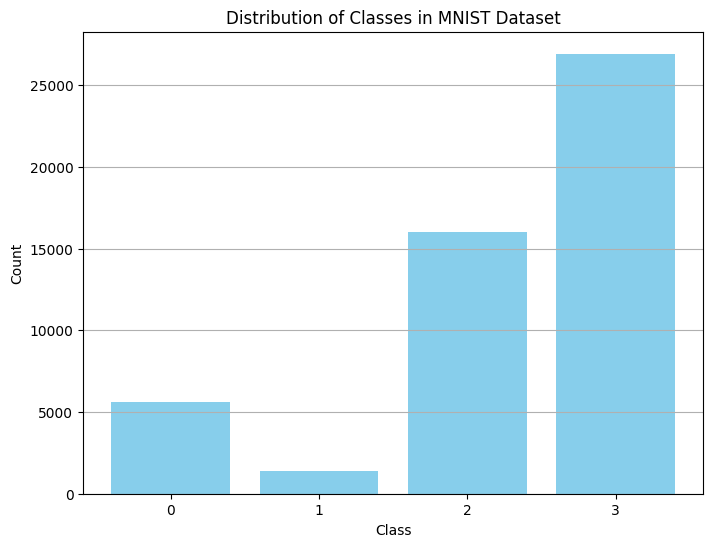

In [ ]:
# Count occurrences of each class and create a DataFrame
class_counts = pd.DataFrame(y.value_counts().reset_index())
class_counts.columns = ['Class', 'Count']
class_counts = class_counts.sort_values('Class')

# Plotting the distribution of classes
plt.figure(figsize=(8, 6))
plt.bar(class_counts['Class'], class_counts['Count'], color='skyblue')
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Distribution of Classes in MNIST Dataset')
plt.xticks(class_counts['Class'])
plt.grid(axis='y')
plt.show()

In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
#  Apply SMOTE (Oversampling)
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

print("Original:", y_train.value_counts())
print("Resampled:", y_train_resampled.value_counts())

Original: experience_level
3    21516
2    12839
0     4523
1     1108
Name: count, dtype: int64
Resampled: experience_level
2    21516
3    21516
0    21516
1    21516
Name: count, dtype: int64


In [ ]:
models = {
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42)
}

for name, model in models.items():
    print(f"\n Training {name}")
    model.fit(X_train_resampled, y_train_resampled )
    y_pred = model.predict(X_test)

    print("Accuracy:", accuracy_score(y_test, y_pred))
    print(classification_report(y_test, y_pred))



 Training Random Forest
Accuracy: 0.4314294288286486
              precision    recall  f1-score   support

           0       0.27      0.34      0.30      1094
           1       0.06      0.14      0.08       274
           2       0.33      0.32      0.32      3208
           3       0.60      0.53      0.56      5421

    accuracy                           0.43      9997
   macro avg       0.31      0.33      0.32      9997
weighted avg       0.46      0.43      0.44      9997


 Training XGBoost


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[17:08:09] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




Accuracy: 0.5408622586776033
              precision    recall  f1-score   support

           0       0.37      0.52      0.43      1094
           1       0.09      0.22      0.13       274
           2       0.50      0.35      0.41      3208
           3       0.66      0.67      0.67      5421

    accuracy                           0.54      9997
   macro avg       0.40      0.44      0.41      9997
weighted avg       0.56      0.54      0.54      9997


 Training Gradient Boosting
Accuracy: 0.4820446133840152
              precision    recall  f1-score   support

           0       0.34      0.55      0.42      1094
           1       0.06      0.30      0.10       274
           2       0.47      0.31      0.38      3208
           3       0.66      0.58      0.62      5421

    accuracy                           0.48      9997
   macro avg       0.38      0.44      0.38      9997
weighted avg       0.55      0.48      0.50      9997



In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from imblearn.over_sampling import SMOTE
from sklearn.feature_selection import SelectKBest, f_classif

# 1. Select top 20 features
selector = SelectKBest(score_func=f_classif, k=20)
X_new = selector.fit_transform(X, y)

# 2. Train/test split (use stratify only if all classes have >= 2 instances)
X_train, X_test, y_train, y_test = train_test_split(
    X_new, y, test_size=0.2, random_state=42, stratify=y
)

# 3. Balance the training set with SMOTE
smote = SMOTE(random_state=42)
X_train_bal, y_train_bal = smote.fit_resample(X_train, y_train)

# 4. Train the LightGBM model
model = GradientBoostingClassifier(random_state=42)
model.fit(X_train_bal, y_train_bal)
# 5. Test the model
y_pred = model.predict(X_test)

# 6. Print evaluation
print(" Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:")
print(classification_report(y_test, y_pred))


/usr/local/lib/python3.11/dist-packages/sklearn/feature_selection/_univariate_selection.py:783: UserWarning:

k=20 is greater than n_features=10. All the features will be returned.



 Accuracy: 0.5397619285785735
Classification Report:
              precision    recall  f1-score   support

           0       0.38      0.52      0.44      1123
           1       0.09      0.18      0.12       276
           2       0.47      0.30      0.37      3210
           3       0.65      0.70      0.67      5388

    accuracy                           0.54      9997
   macro avg       0.40      0.43      0.40      9997
weighted avg       0.55      0.54      0.54      9997



In [ ]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
x_scaled = sc.fit_transform(x)

In [ ]:
from sklearn.decomposition import PCA

# Apply PCA to reduce dimensions
pca = PCA(n_components=0.95)  # Retaining 95% variance
X_pca = pca.fit_transform(x_scaled)

# Train-Test Split with PCA-transformed data
X_train_pca, X_test_pca, y_train, y_test = train_test_split(X_pca, y, test_size=0.3, random_state=42)

# Train Random Forest with PCA-transformed data
model_pca = RandomForestClassifier(n_estimators=100, random_state=42)
model_pca.fit(X_train_pca, y_train)

# Accuracy with PCA
train_accuracy_pca = model_pca.score(X_train_pca, y_train)
test_accuracy_pca = model_pca.score(X_test_pca, y_test)

print(f"Train Accuracy (with PCA): {train_accuracy_pca * 100:.2f}%")
print(f"Test Accuracy (with PCA): {test_accuracy_pca * 100:.2f}%")


NameError: name 'x_scaled' is not defined

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(x_scaled, y, test_size=0.3, random_state=42)

# Model: Random Forest Classifier
model = model = RandomForestClassifier(n_estimators=100, random_state=42, max_depth=10, min_samples_split=10, min_samples_leaf=5)

model.fit(X_train, y_train)


# Calculate train and test accuracy
train_accuracy = model.score(X_train, y_train)
test_accuracy = model.score(X_test, y_test)

# Print the accuracies
print(f"Train Accuracy: {train_accuracy * 100:.2f}%")
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

# Evaluate the model
y_pred = model.predict(X_test)

# Print classification report and confusion matrix
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

# Cross-validation scores
cv_scores = cross_val_score(model, x_scaled, y, cv=5)
print("Cross-validation scores:", cv_scores)
print("Mean CV score:", cv_scores.mean())

Train Accuracy: 100.00%
Test Accuracy: 100.00%
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1677
           1       1.00      1.00      1.00       404
           2       1.00      1.00      1.00      4798
           3       1.00      1.00      1.00      8116

    accuracy                           1.00     14995
   macro avg       1.00      1.00      1.00     14995
weighted avg       1.00      1.00      1.00     14995

Confusion Matrix:
 [[1677    0    0    0]
 [   0  404    0    0]
 [   0    0 4798    0]
 [   0    0    0 8116]]
Cross-validation scores: [0.99979994 1.         0.99989997 0.99969988 1.        ]
Mean CV score: 0.9998799579849944


In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import cross_val_score

# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(x_scaled, y, test_size=0.3, random_state=42)

# Model: Support Vector Machine
model_svm = SVC(kernel='rbf', random_state=42, C=1.0, gamma='scale')
model_svm.fit(X_train, y_train)

# Calculate train and test accuracy
train_accuracy_svm = model_svm.score(X_train, y_train)
test_accuracy_svm = model_svm.score(X_test, y_test)

print(f"Train Accuracy (SVM): {train_accuracy_svm * 100:.2f}%")
print(f"Test Accuracy (SVM): {test_accuracy_svm * 100:.2f}%")

# Evaluate the model
y_pred_svm = model_svm.predict(X_test)

# Print classification report and confusion matrix
print("Classification Report (SVM):\n", classification_report(y_test, y_pred_svm))
print("Confusion Matrix (SVM):\n", confusion_matrix(y_test, y_pred_svm))

# Cross-validation scores
cv_scores_svm = cross_val_score(model_svm, x_scaled, y, cv=5)
print("Cross-validation scores (SVM):", cv_scores_svm)
print("Mean CV score (SVM):", cv_scores_svm.mean())


Train Accuracy (SVM): 99.89%
Test Accuracy (SVM): 99.72%
Classification Report (SVM):
               precision    recall  f1-score   support

           0       0.99      0.99      0.99      1677
           1       1.00      0.98      0.99       404
           2       0.99      1.00      1.00      4798
           3       1.00      1.00      1.00      8116

    accuracy                           1.00     14995
   macro avg       1.00      0.99      0.99     14995
weighted avg       1.00      1.00      1.00     14995

Confusion Matrix (SVM):
 [[1663    0   11    3]
 [   1  394    9    0]
 [   8    0 4789    1]
 [   2    0    7 8107]]
Cross-validation scores (SVM): [0.97469241 0.9979994  0.99919976 0.9984994  0.99839936]
Mean CV score (SVM): 0.9937580653948086


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import cross_val_score

# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(x_scaled, y, test_size=0.3, random_state=42)

# Model: K-Nearest Neighbors
model_knn = KNeighborsClassifier(n_neighbors=5)
model_knn.fit(X_train, y_train)

# Calculate train and test accuracy
train_accuracy_knn = model_knn.score(X_train, y_train)
test_accuracy_knn = model_knn.score(X_test, y_test)

print(f"Train Accuracy (KNN): {train_accuracy_knn * 100:.2f}%")
print(f"Test Accuracy (KNN): {test_accuracy_knn * 100:.2f}%")

# Evaluate the model
y_pred_knn = model_knn.predict(X_test)

# Print classification report and confusion matrix
print("Classification Report (KNN):\n", classification_report(y_test, y_pred_knn))
print("Confusion Matrix (KNN):\n", confusion_matrix(y_test, y_pred_knn))

# Cross-validation scores
cv_scores_knn = cross_val_score(model_knn, x_scaled, y, cv=5)
print("Cross-validation scores (KNN):", cv_scores_knn)
print("Mean CV score (KNN):", cv_scores_knn.mean())


Train Accuracy (KNN): 99.52%
Test Accuracy (KNN): 99.13%
Classification Report (KNN):
               precision    recall  f1-score   support

           0       0.97      0.97      0.97      1677
           1       1.00      0.95      0.98       404
           2       0.99      0.99      0.99      4798
           3       1.00      1.00      1.00      8116

    accuracy                           0.99     14995
   macro avg       0.99      0.98      0.98     14995
weighted avg       0.99      0.99      0.99     14995

Confusion Matrix (KNN):
 [[1619    0   40   18]
 [   1  385   18    0]
 [  34    0 4762    2]
 [  14    0    3 8099]]
Cross-validation scores (KNN): [0.9779934  0.99549865 0.99719916 0.9944978  0.97629052]
Mean CV score (KNN): 0.9882959045376678


In [ ]:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier

# RandomizedSearchCV: Random search over parameter distributions
param_dist = {
    'n_estimators': [50, 100, 150, 200],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 5],
    'bootstrap': [True, False]
}

random_search = RandomizedSearchCV(estimator=RandomForestClassifier(random_state=42), param_distributions=param_dist,
                                   n_iter=100, cv=5, verbose=2, random_state=42, n_jobs=-1)
random_search.fit(X_train, y_train)

# Best parameters from RandomizedSearchCV
print("Best parameters from RandomizedSearchCV: ", random_search.best_params_)

# Evaluate on test data
test_accuracy_random = random_search.score(X_test, y_test)
print(f"Test Accuracy (RandomizedSearchCV): {test_accuracy_random * 100:.2f}%")


Fitting 5 folds for each of 100 candidates, totalling 500 fits
Best parameters from RandomizedSearchCV:  {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_depth': None, 'bootstrap': False}
Test Accuracy (RandomizedSearchCV): 100.00%


In [ ]:
# Define the parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 5],
    'max_features': ['auto', 'sqrt', 'log2'],
    'bootstrap': [True, False]
}

# GridSearchCV
grid_search = GridSearchCV(estimator=RandomForestClassifier(random_state=42), param_grid=param_grid,
                           cv=5, n_jobs=-1, verbose=2)
grid_search.fit(X_train, y_train)

# Best parameters from GridSearchCV
print("Best parameters found: ", grid_search.best_params_)

# Evaluate on test data
test_accuracy_grid = grid_search.score(X_test, y_test)
print(f"Test Accuracy (GridSearchCV): {test_accuracy_grid * 100:.2f}%")


Fitting 5 folds for each of 486 candidates, totalling 2430 fits


/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning:


810 fits failed out of a total of 2430.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
332 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 1382, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 436, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.11/dist-packages/sklearn/ut

Best parameters found:  {'bootstrap': True, 'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50}
Test Accuracy (GridSearchCV): 100.00%


# Part 7.Clustering Model

In [ ]:
from sklearn.metrics import silhouette_score

# جرب عدد من الكلاسات
silhouette_scores = []
range_n_clusters = range(2, 11)

for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(X_pca)
    score = silhouette_score(X_pca, kmeans.labels_)
    silhouette_scores.append(score)

# رسم Silhouette Scores
plt.figure(figsize=(8, 6))
plt.plot(range_n_clusters, silhouette_scores, marker='o')
plt.title('Silhouette Score for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.show()

# العثور على العدد الذي له أعلى Silhouette Score
optimal_clusters_silhouette = range_n_clusters[silhouette_scores.index(max(silhouette_scores))]
print(f"Optimal number of clusters based on Silhouette Score: {optimal_clusters_silhouette}")


NameError: name 'X_pca' is not defined

In [ ]:
# افترض أنك اخترت العدد الأمثل للكلاسات من الرسم
optimal_clusters = 4  # على سبيل المثال، إذا كانت النقطة الأمثل هي 3

# تطبيق KMeans باستخدام العدد الأمثل للكلاسات
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
kmeans.fit(X_pca)

# الحصول على التصنيفات (التجميعات)
df_cleaned2['cluster'] = kmeans.labels_

# عرض النتائج
print(df_cleaned2[['work_year', 'experience_level', 'cluster']])


       work_year  experience_level  cluster
88572       2020                 2        2
88570       2020                 2        0
88494       2020                 3        0
88495       2020                 0        0
88569       2020                 3        0
...          ...               ...      ...
9805        2025                 0        0
9804        2025                 0        0
9872        2025                 2        0
9802        2025                 0        0
9801        2025                 2        0

[49983 rows x 3 columns]


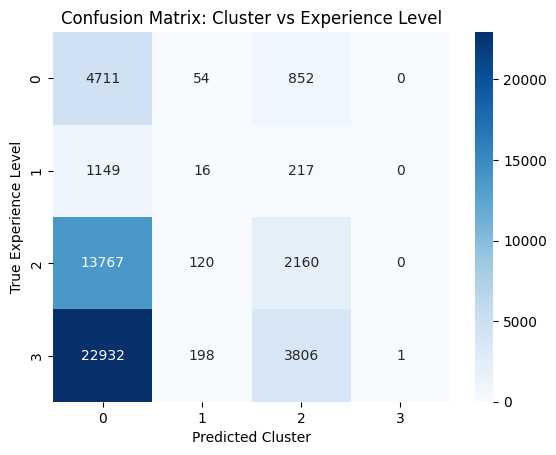

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# إنشاء مصفوفة الالتباس
cm = confusion_matrix(df_cleaned2['experience_level'], df_cleaned2['cluster'])

# عرضها بالرسم
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=range(optimal_clusters), yticklabels=sorted(df_cleaned2['experience_level'].unique()))
plt.xlabel('Predicted Cluster')
plt.ylabel('True Experience Level')
plt.title('Confusion Matrix: Cluster vs Experience Level')
plt.show()


In [ ]:
from sklearn.metrics import adjusted_rand_score

ari = adjusted_rand_score(df_cleaned2['experience_level'], df_cleaned2['cluster'])
print(f"Adjusted Rand Index: {ari:.3f}")


Adjusted Rand Index: 0.002


In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Step 2: Save the true labels for evaluation (e.g., experience level)
true_labels = df_cleaned2['experience_level']

# Step 3: Drop label columns and encode categorical features
X = df.drop(columns=['experience_level', 'job_title', 'salary_currency'])  # Ignore label/class columns

# Encode categorical columns
categorical_cols = X.select_dtypes(include=['object']).columns
X[categorical_cols] = X[categorical_cols].apply(LabelEncoder().fit_transform)

# Step 4: Normalize the features
X_scaled = StandardScaler().fit_transform(X)

# Step 5: Fit KMeans with known number of clusters (e.g., len(true_labels.unique()))
n_clusters = len(true_labels.unique())
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(X_scaled)

# Step 6: Evaluate using Adjusted Rand Index (external metric)
ari = adjusted_rand_score(true_labels, cluster_labels)
print(f"Adjusted Rand Index (ARI): {ari:.3f}")

# Step 7: Visualize clusters
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)
custom_cmap = ListedColormap(['blue', 'orange', 'green', 'red'])
plt.figure(figsize=(8,6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=cluster_labels, cmap=custom_cmap, s=50)
plt.title('KMeans Clustering (Colored by Cluster Assignment)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.colorbar(label='Cluster ID')
plt.show()


NameError: name 'df_cleaned2' is not defined